In [ ]:
#IMPORTANT: RUN THESE ANSWERS CONSECUTIVELY AS SOME ANSWERS OR DEFINITIONS ARE REUSED IN THE FOLLOWING QUESTION
#IF YOU DONT RUN ALL THE CODE BEFORE A CERTAIN PART, YOU MIGHT GET AN ERROR

In [2]:
from os import access
import pandas as pd
import numpy as np
import datetime
from pandas.core.reshape.concat import concat
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from datetime import date, datetime,timedelta
from sklearn.cluster import KMeans
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import statistics as st
!pip install haversine
import haversine as hs
from itertools import permutations, combinations
from collections import Counter
!pip install pandas MLxtend
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

You should consider upgrading via the '/Users/anbouckaert/opt/anaconda3/bin/python -m pip install --upgrade pip' command.
     |████████████████████████████████| 1.3 MB 342 kB/s 
You should consider upgrading via the '/Users/anbouckaert/opt/anaconda3/bin/python -m pip install --upgrade pip' command.


In [32]:
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping EmployeeData (HVC_AM0)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------

#Reading the file and storing each line in the list text
with open ("HVC_AM0.csv", "r") as f:
    textEmployees = f.readlines()
textEmployees.pop(0)

#We make a dictionnary based on the data
CompanyEmployeesDict = {}

for e in textEmployees:
    Employee_ID, EmployeeNumber, Name, Postcode, Location, Language = e.replace("\n","").split(";")
    Employee_ID=int(Employee_ID)
    Postcode=int(Postcode)
    CompanyEmployeesDict[Employee_ID]= {"EmployeeNumber":EmployeeNumber,"Name": Name, "Postcode": Postcode, "Location": Location,"Language": Language }


#Some Employees do not have a EmployeeNumber: We set the EmployeeNumber of these employees to 0
#In this way we can convert all to a float
for e in CompanyEmployeesDict:
    E_ID = CompanyEmployeesDict[e]["EmployeeNumber"]
    if(E_ID == ""):
        CompanyEmployeesDict[e]["EmployeeNumber"]="0"
    CompanyEmployeesDict[e]["EmployeeNumber"] = int(float(CompanyEmployeesDict[e]["EmployeeNumber"]))   

df_CompanyEmployees = pd.DataFrame.from_dict(CompanyEmployeesDict, orient = 'index')


#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping ProductData (HVC_AR0)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------


with open ("HVC_AR0.csv", "r") as f:
    textProducts = f.readlines()
textProducts.pop(0)

CompanyProductsDict = {}
for e in textProducts:
    ProductID, Description, Category, Family, Price = e.replace("\n","").split(";")
    ProductID = int(ProductID)
    CompanyProductsDict[ProductID]= {"Description":Description,"Category": Category, "Family": Family, "Price": Price}
   
#Some prices are missing   
for e in CompanyProductsDict:
  PriceCheck = CompanyProductsDict[e]["Price"]
  if(PriceCheck==""):
        CompanyProductsDict[e]["Price"]="0.0"
  CompanyProductsDict[e]["Price"]=float(CompanyProductsDict[e]["Price"])  

#Whenever they are Coupons they are not assigned a family
#We assign Coupon to its Family for clearity
for e in CompanyProductsDict:
  PriceCheck = CompanyProductsDict[e]["Family"]
  if(PriceCheck==""):
        CompanyProductsDict[e]["Family"]="Coupon"

df_Products = pd.DataFrame.from_dict(CompanyProductsDict, orient = 'index')


#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping Reviews Data (HVC_CUSTOMER_REVIEWS)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------   


with open ("HVC_CUSTOMER_REVIEWS.csv", "r") as f:
    textCustReviews = f.readlines()
textCustReviews.pop(0)

CompanyReviewsDict = {}
for e in textCustReviews:
    CustomerID, Review  = e.replace("\n","").split(";")
    CustomerID = int(CustomerID)
    CompanyReviewsDict[CustomerID]= {"Review": Review}

df_Reviews = pd.DataFrame.from_dict(CompanyReviewsDict, orient = 'index')


#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping Depot data (HVC_DEPOT)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------


#Reading the file and storing each line in the list text
with open ("HVC_DEPOT.csv", "r") as f:
    text_Depot = f.readlines()
text_Depot.pop(0)

#We make a dictionnary based on the data
Depot_Dict = {}

for dep in text_Depot:
    Depot_Id, Depot_Location, Depot_Route = dep.replace("\n","").split(";")
    Depot_Id = int(Depot_Id)
    Depot_Route = int(Depot_Route)
    Depot_Dict[Depot_Id] = {"DEPOT":Depot_Location, "HVROUTETEMPLATE_NRID":Depot_Route}

#The Depot_Id and HVROUTETEMPLATE_NRID are both integers, Depot_Location
#The names of the keys are based on the table descriptions for easy looking up in case of further calculations
#There are no missing values in our dictionnary so further preprocessing is not necessary.

df_Depot = pd.DataFrame.from_dict(Depot_Dict, orient = 'index')


#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping DaysOfWeek (HVC_HVDAYOFWEEK)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------


with open ("HVC_HVDAYOFWEEK.csv", "r") as f:
    text_DayOfWeek = f.readlines()
text_DayOfWeek.pop(0)

#We make a dictionnary based on the data
DayOfWeek_Dict = {}

for day in text_DayOfWeek:
    HVDAYOFWEEK_NRID, DAY = day.replace("\n","").split(";")
    HVDAYOFWEEK_NRID = int(float(HVDAYOFWEEK_NRID))
    DayOfWeek_Dict[int(HVDAYOFWEEK_NRID)] = DAY


#The HVDAYOFWEEK_NRID is an integer, DAY is a string. 
#!! important notice for further caclulations, the first day (day with id = 1) is a sunday! Not a monday!
df_DaysOfWeek = pd.DataFrame.from_dict(DayOfWeek_Dict, orient = 'index')


#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping Position data (HVC_HVPOSITION)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------


with open ("HVC_HVPOSITION_CORRECT.csv", "r") as f:
    text_Position = f.readlines()
text_Position.pop(0)

#We make a dictionnary based on the data
Position_Dict = {}

for loc in text_Position:
    SO0_NRID, LONG, LAT = loc.replace("\n","").split(";")
    SO0_NRID = int(float(SO0_NRID))
    LONG = float(LONG)
    LAT = float(LAT)
    Position_Dict[SO0_NRID] = {"LONG":LONG, "LAT":LAT}

#SO0_NRID is int, LONG and LAT are both float values.

df_Position = pd.DataFrame.from_dict(Position_Dict, orient = 'index')


#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping Route Template data (HVC_HVROUTETEMPLATE)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------


with open ("HVC_HVROUTETEMPLATE.csv", "r") as f:
    textRouteTemplate = f.readlines()
    textRouteTemplate.pop(0)
    
RouteTemplate_Dict = {}

for route in textRouteTemplate:
    HVROUTETEMPLATE_NRID, REGION, WEEKORDER, HVDAYOFWEEK_NRID = route.replace("\n","").split(";")
    HVROUTETEMPLATE_NRID=int(float(HVROUTETEMPLATE_NRID))
    RouteTemplate_Dict[HVROUTETEMPLATE_NRID] = {"REGION": REGION, "WEEKORDER": WEEKORDER, "DAYOFWEEK_NRID": HVDAYOFWEEK_NRID}        

df_RouteTemplate = pd.DataFrame.from_dict(RouteTemplate_Dict, orient = 'index')


#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping Visit Outcome data (HVC_HVVISITOUTCOME)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------


with open ("HVC_HVVISITOUTCOME.csv", "r") as f:
    textVisitOutcome = list()
    for line in f:
        line = line.replace("\n","")
        obs = line.split(";")
        textVisitOutcome.append(obs)

column_names = textVisitOutcome[0]
textVisitOutcome.pop(0)
VisitOucome_Dict = {}

for visit in textVisitOutcome:
    VisitOucome_Dict[visit[1]] = visit[0]


df_VisitOutcome = pd.DataFrame.from_dict(VisitOucome_Dict, orient = 'index')


#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping TransactionData (HVC_HVVISITRESULT)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------


#Reading the file and storing each line in the list text
with open ("HVC_HVVISITRESULT.csv", "r") as f:
    textVisit = f.readlines()
textVisit.pop(0)

#We make a dictionnary based on the data
CompanyVisitDict = {}

for e in textVisit:
    Visit_ID, Customer_ID, Employee_ID, VisitOutcome_ID, Time, Date, Amount, paymentMethod = e.replace("\n","").split(";")
    Visit_ID= int(Visit_ID)

    yYear, mMonth, dDay = Date.split("-")
    yYear = int(yYear)
    mMonth = int(mMonth)
    dDay = int(dDay)
    Date=date(yYear,mMonth,dDay)

    Customer_ID= int(Customer_ID)
    Employee_ID= int(Employee_ID)
    VisitOutcome_ID= int(VisitOutcome_ID)
    Amount= float(Amount)
    CompanyVisitDict[Visit_ID]= {"Customer_ID":Customer_ID,"Employee_ID": Employee_ID, "VisitOutcome_ID": VisitOutcome_ID, "Time": Time,"Date": Date, "Amount": Amount, "paymentMethod": paymentMethod }

#Some visits do not have a payment method recorded: We set the paymentMethod of these cases to the None variable
#Maybe these missing values will have value later on
for e in CompanyVisitDict:
    P_method = CompanyVisitDict[e]["paymentMethod"]
    if(P_method == ""):
        CompanyVisitDict[e]["paymentMethod"]= None

df_CompanyVisit = pd.DataFrame.from_dict(CompanyVisitDict, orient = 'index')

#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping EmployeeData (HVC_SO0)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------


#Reading the file and storing each line in the list text
with open ("HVC_SO0.csv", "r") as f:
    textCustomerType = f.readlines()
textCustomerType.pop(0)

#We make a dictionnary based on the data
CustomerTypeDict = {}

for e in textCustomerType:
    Customer_ID, RouteTemplate_ID, CustomerType, Postcode, Language, Season = e.replace("\n","").split(";")
    Customer_ID=int(float(Customer_ID))
    RouteTemplate_ID=int(float(RouteTemplate_ID))
    Postcode = int(float(Postcode))
    CustomerTypeDict[Customer_ID]= {"RouteTemplate_ID":RouteTemplate_ID,"CustomerType": CustomerType, "Postcode": Postcode, "Language": Language,"Season": Season}


df_CustomerType = pd.DataFrame.from_dict(CustomerTypeDict, orient = 'index')

#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping ProductData (HVC_VISITRESULTDETAILS)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------


with open ("HVC_VISITRESULTDETAILS.csv", "r") as f:
    textVisitDetails = f.readlines()
textVisitDetails.pop(0)


#We make a dictionnary based on the data
VisitDetailsDict = {}


for e in textVisitDetails:
    VisitDetails_ID, Product_ID, Quantity, Visit_ID = e.replace("\n","").split(";")
    VisitDetails_ID=int(VisitDetails_ID)
    Product_ID=int(Product_ID)
    Quantity=int(float(Quantity))
    Visit_ID=int(float(Visit_ID))
    VisitDetailsDict[VisitDetails_ID]= {"Product_ID":Product_ID,"Quantity": Quantity, "Visit_ID": Visit_ID}

df_VisitDetails = pd.DataFrame.from_dict(VisitDetailsDict, orient = 'index')


#---------------------------------------------------------------------------------------------------------------------------------------------------------------------------
#This gives us the following 11 dataframes to work with:
# 1  df_CompanyEmployees (HVC_AM0)
# 2  df_Products (HVC_AR0)
# 3  df_Reviews  (HVC_CUSTOMER_REVIEWS)
# 4  df_Depot  (HVC_DEPOT)
# 5  df_DaysOfWeek (HVC_HVDAYOFWEEK)
# 6  df_Position (HVC_HVPOSiTION)
# 7  df_RouteTemplate (HVC_HVROUTETEMPLATE)
# 8  df_VisitOutcome (HVC_HVVISITOUTCOME)
# 9  df_CompanyVisit (HVC_VISITRESULT)
# 10 df_CustomerType (HVC_SO0)
# 11 df_VisitDetails (HVC_VISITRESULTDETAILS)

#---------------------------------------------------------------------------------------------------------------------------------------------------------------------------


In [3]:
############################################
#Q5 How can the company improve its service?
############################################

In [33]:
#Here we make a complete price frame containing: VisitID's, corresponding Customer_ID's
#And the corresponding Product_ID's bought during those visits
#For visitdetails (which products bought)
df_CustomerType["Customer_ID"] = df_CustomerType.index
df_CompanyVisit["Visit_ID"] = df_CompanyVisit.index
df_Products["Product_ID"] = df_Products.index


df_SeasonPrep = pd.merge(df_CompanyVisit, df_VisitDetails, how="left", on="Visit_ID")

#Now for product info
df_CompletePriceFrame = pd.merge(df_SeasonPrep, df_Products, how="left", on="Product_ID").dropna()

#What revenue is gained for each single product during a single visit
df_CompletePriceFrame["RevenueProduct"] = df_CompletePriceFrame["Quantity"]*df_CompletePriceFrame["Price"]

#Drop unneeded columns
df_CompletePriceFrame = df_CompletePriceFrame.drop(columns=["Time","paymentMethod"])

#We define CLV dataframe
df_CLV = df_CompletePriceFrame.groupby("Customer_ID")["RevenueProduct"].sum().sort_values(ascending=False)

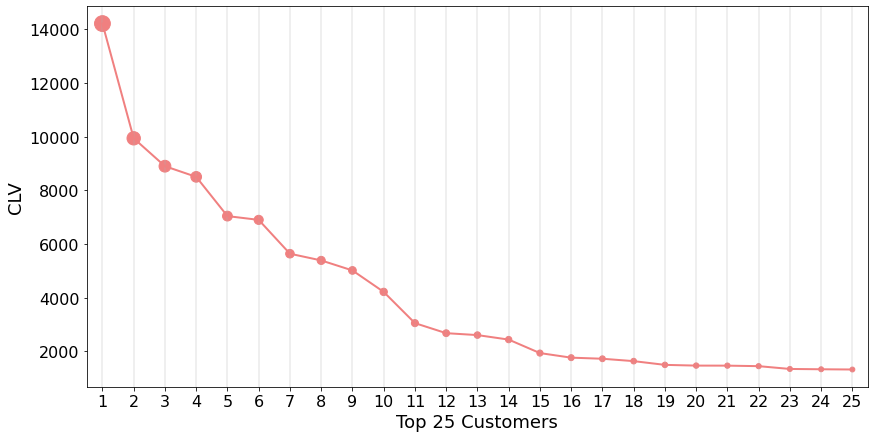

In [34]:
#Q5.1 Which customers should be rewarded?
#These would have to be the customers with the highest CLV: These have brought in the most
#Revenue for the firm over their lifetime
#In total we have 5709 customers

#Looking at the list we can find that the first customer on the list has an enormous
#14 211: so it is important to keep this customer
#There are also runner ups with 9938 and 8899
#The highest performing customers are the most important
#What is important to see is that between place 1 and 5 the CLV has already halved!
lyis = list()
df_CLVFlipped = df_CLV.head(25)
lyis = df_CLV.head(25)
#print(lyis)

lxis = list()
lxis = range(1,26)

plt.figure(figsize=(14,7))
s = [(250/((n/2.5)+1)) for n in range(len(lxis))]
plt.scatter(lxis,lyis, s=s, color="lightcoral")
plt.plot(lxis,lyis, color='lightcoral', linewidth=2)
plt.locator_params(axis="x", nbins=25)
plt.xlim(0.5,25.5)
plt.grid(linewidth=0.4, axis="x")
plt.ylabel('CLV', fontsize=18)
plt.xlabel('Top 25 Customers', fontsize=18)
plt.rc('xtick', labelsize=16) 
plt.rc('ytick', labelsize=16)
plt.xlim()
plt.show()

#Looking at the graph we can see that the first customer clearly overperforms others
#Another insight can be that after the top 10 customers we arrive at an ellbow
#CLV starts to stagnate and in scale converges to zero
#So it is very important to focus on the first 10 best CLV performing Customers


In [6]:
#So these customers deserve rewards to surely keep them within the company
#We merge again with Customer Type to get the specific info on these customers

df_RewardFrame = pd.merge(df_CLV.head(10),df_CustomerType, how="left",on="Customer_ID").drop(columns=["RouteTemplate_ID"])
print(df_RewardFrame)

#If we take a look at these customers we find: 
#6 are Horeca and 4 are Catering customers: no private customers
#All speak Dutch

      Customer_ID  RevenueProduct CustomerType  Postcode Language    Season
0          721228        14211.50       Horeca      3910    nl-BE  All time
1         1451799         9938.90       Horeca      3640    nl-BE  All time
2  20256376185452         8899.80     Catering      3550    nl-BE  All time
3          728498         8503.20       Horeca      3950    nl-BE  All time
4         1250991         7041.70       Horeca      3582    nl-BE  All time
5         1455143         6901.10       Horeca      3680    nl-BE  All time
6         1247191         5640.80     Catering      3582    nl-BE  All time
7          727602         5391.30     Catering      3930    nl-BE  All time
8  18321288654234         5018.30     Catering      3550    nl-BE  All time
9  18416552167454         4218.95       Horeca      3590    nl-BE  All time


In [7]:
#If we have a look and calculate the CLV over all customers combined
#We can calculate the share in the total CLV these top 10 customers have
CompleteCLV = df_CLV.values.sum()
print("The complete CLV is:",CompleteCLV)
print()
df_RewardFrame["Share in CLV"]=(df_RewardFrame["RevenueProduct"]/CompleteCLV)*100
print(df_RewardFrame.drop(columns="Postcode"))

#Now we look at the share of all top 10 Customers in the total CLV
CLV_Top_10 = df_RewardFrame["Share in CLV"].sum()
print()
print("The top 10 customers share ",CLV_Top_10," percent in the total CLV")
shareSpace = (10/len(df_CustomerType))*100
print("in other words only ", shareSpace, " percent of your customers")
print("already give a 7.12 percent share of the CLV")

#We can now see that keeping the top customers happy can be a good tactic 
#The top 10 customers jointly get 7.12 percent of the total CLV
#This is not a huge percentage but a nice insight


The complete CLV is: 1064449.8

      Customer_ID  RevenueProduct CustomerType Language    Season  \
0          721228        14211.50       Horeca    nl-BE  All time   
1         1451799         9938.90       Horeca    nl-BE  All time   
2  20256376185452         8899.80     Catering    nl-BE  All time   
3          728498         8503.20       Horeca    nl-BE  All time   
4         1250991         7041.70       Horeca    nl-BE  All time   
5         1455143         6901.10       Horeca    nl-BE  All time   
6         1247191         5640.80     Catering    nl-BE  All time   
7          727602         5391.30     Catering    nl-BE  All time   
8  18321288654234         5018.30     Catering    nl-BE  All time   
9  18416552167454         4218.95       Horeca    nl-BE  All time   

   Share in CLV  
0      1.335103  
1      0.933712  
2      0.836094  
3      0.798835  
4      0.661534  
5      0.648326  
6      0.529926  
7      0.506487  
8      0.471445  
9      0.396350  

The top 1

In [8]:
#We defined CLV and add it to our customertypes
df_CustomerType2 = pd.merge(df_CustomerType, df_CLV, on = "Customer_ID", how = "right")


print(df_CustomerType2.drop(columns=["Season","Postcode","Language","RouteTemplate_ID"]).sort_values(by="RevenueProduct",ascending=False).head(40))
#The highest Person in the list is on place 15: This is quite shocking  that a Private customer can land on place 15 followed by horeca and caterers
#Since these people are "smaller" than a caterer or horeca shops they are more subject to changes etc so keeping Private customer loyal remains very important
#Private customers bring in quite alot of CLV and the higest should receive special attention
#The plot made earlier showing the convergens indicates to focus on the biggest performing CLV customers from horeca and Catering
#But Private customers should be treated differntly and be rewarded more extensively
#So we would recommend rewarding the top 10 or 15 Horeca and Catering shops
#But the firm should reward more Private Customers
#Since it has been shown they have a good share in CLV and rewarding them is less expensive overall
#And keep them happy

df_PrivateShare = df_CustomerType2.drop(columns=["Season","Postcode","Language","RouteTemplate_ID"]).sort_values(by="RevenueProduct",ascending=False).head(40)
privateShare = df_PrivateShare["RevenueProduct"].sum()
CLVprivateShare = (privateShare/CompleteCLV)*100
sharePersons = (40/len(df_CustomerType))*100
#print(CLVprivateShare," percent of CLV generated by")
#print(sharePersons, "percent of all customers")

#We can also put these together:
print(CLVprivateShare+7.12, "percent of CLV is generated by the top 10 horeca and catering customers + the top 50 private customers")
print("Which together only are ",sharePersons+shareSpace, "percent of all your customers")


   CustomerType     Customer_ID  RevenueProduct
0        Horeca          721228        14211.50
1        Horeca         1451799         9938.90
2      Catering  20256376185452         8899.80
3        Horeca          728498         8503.20
4        Horeca         1250991         7041.70
5        Horeca         1455143         6901.10
6      Catering         1247191         5640.80
7      Catering          727602         5391.30
8      Catering  18321288654234         5018.30
9        Horeca  18416552167454         4218.95
10       Horeca         1403452         3056.15
11       Horeca         1246194         2681.70
12     Catering         1459877         2610.50
13     Catering  20682568164250         2442.80
14      Private         1249611         1940.50
15      Private          871033         1770.10
16       Horeca  23984664674452         1729.30
17     Catering         1405104         1640.60
18       Horeca          879714         1501.50
19      Private          876592         

In [9]:
#Now we make a rewardframe: containing the people that should be rewarded
df_RewardFramePrivate = pd.merge(df_CLV,df_CustomerType, how="left",on="Customer_ID").drop(columns=["RouteTemplate_ID"]).sort_values(by="RevenueProduct",ascending=False)
df_RewardFramePrivate =  df_RewardFramePrivate[df_RewardFramePrivate["CustomerType"] == "Private"]

print(df_RewardFramePrivate.head(50))
#Based on the following result rewarding the first 50 Private customers would be adviced
#They are big spenders and should be kept 
#After the top 50 Private customers
#The value of CLV quickly diverges to 500 and lower 
#These customers are not recommended to reward since their share is not high enough in the CLV
#And many more customers are in this CLV range distribution 

       Customer_ID  RevenueProduct CustomerType  Postcode Language    Season
14         1249611         1940.50      Private      3550    nl-BE  All time
15          871033         1770.10      Private      3650    nl-BE  All time
19          876592         1474.30      Private      3660    nl-BE  All time
20          871291         1472.50      Private      3650    nl-BE  All time
21         1398221         1453.35      Private      3590    nl-BE  All time
29          871486         1219.10      Private      3650    nl-BE  All time
31  22112248445240         1153.10      Private      3590    nl-BE  All time
35         1395324         1120.60      Private      3590    nl-BE  All time
37          875003         1115.60      Private      3670    nl-BE  All time
38          871636         1070.00      Private      3650    nl-BE  All time
39         1451914         1059.10      Private      3640    nl-BE  All time
40         1247604         1043.40      Private      3582    nl-BE  All time

In [10]:
#Now another relevent topic when discussing this question
#We made a plot earlier, about the average number of days between purchases

#We can see that when looking at Churners: they tend to buy very quickly and then "burn-out"
#We go deeper into this in Question 5.3
#But from this plot we can conclude that little time between purchases needs to be rewarded:
#You motivate spenders to spend more and are able to prevent Churn.
#Tracking quick spending behaviour between Customers is a lot of work and yield little results

#So our recommendation would be to offer reward programs: Loyalty cards that track purchases
#And offers discounts/other rewards when the customers buys alot between a certain by the firm
#Defined gap of time


In [11]:
#Q5.2 Which employees should be rewarded?
# This questions is already answered in Q3

In [12]:
#Q5.3 To which customers should the company send coupons in order to win them back?

In [13]:
#Q5.4 Are there factors that the company can change in order to decrease the churning rate?

In [14]:
#Q5.5 Would it be valuable to recommend (upsell / cross sell) products to a customer?
# Q5.5 Would it be valuable to recommend (upsell / cross sell) products to a customer? 
# To answer this question, we will use a collaborative filtering analysis. 
# Through this analysis, we are going to be able to give customer based product recommendations
# based on the history of the customer and the purchase history of other (similar) customers

from sklearn.metrics.pairwise import cosine_similarity

# first, we create the appropriate dataframe for this question
# df_cross_rec_cust stands for cross selling recommendations (of products) on specific customers
df_Products["Product_ID"] = df_Products.index
df_cross_rec_cust_part1 = pd.merge(df_Products, df_VisitDetails, how = "inner", on = "Product_ID")
df_cross_rec_cust = pd.merge(df_CompanyVisit,df_cross_rec_cust_part1, how = "inner", on = "Visit_ID")


# we convert Customer_ID to a string as this is necessary for the imported functions
df_cross_rec_cust['Customer_ID'] = df_cross_rec_cust['Customer_ID'].astype('str')

# This part will cover the analysis regarding cross selling of products per customer
# This dataset differs from the dataset Q1.4 (market_basket) as now the purchase history is not ranked by
# Visit_ID, but by the customer_ID's
# This allows us to recommend products on a customer basis
market_basket_cust = df_cross_rec_cust.groupby(['Customer_ID', 'Description'])['Quantity']

# Next, we want to encode the data and get 1 transaction per row to prepare to run our mlxtend analysis.
market_basket_cust = market_basket_cust.sum().unstack().reset_index().fillna(0).set_index('Customer_ID')
# print(market_basket.head(5))

# If there is a zero, that means those products haven’t sold together. 
# Before we continue, we want to convert all of our numbers to either a `1` or a `0`
# Therefore, we define the following function
def encode_data(datapoint):
    if datapoint <= 0:
        return 0
    if datapoint >= 1:
        return 1

# now we are going to apply this function to create our desired dataset:
market_basket_cust = market_basket_cust.applymap(encode_data)
market_basket_cust

# To measure the similarity between users, we will use the cosine_similarity method in the scikit-learn package
user_user_sim_matrix = pd.DataFrame(cosine_similarity(market_basket_cust))
user_user_sim_matrix

# As you can see, the index and the names of the columns are not easy to understand. 
# The values in the matrix are the cosine similarities between the clients
# Since each column and row in the index represents individual clients, we're going to rename 
# the index and columns using the following code:
user_user_sim_matrix.columns = market_basket_cust.index

user_user_sim_matrix['CustomerID'] = market_basket_cust.index
user_user_sim_matrix = user_user_sim_matrix.set_index('CustomerID')

user_user_sim_matrix

Customer_ID,10289787,10289793,1244884,1245116,1245295,1245306,1245312,1245318,1245334,1245346,...,880166,880182,880188,880220,880333,880348,880353,880373,880478,880644
CustomerID,,,,,,,,,,,,,,,,,,,,,
10289787,1.000000,0.000000,0.084515,0.000000,0.101015,0.000000,0.296500,0.000000,0.109109,0.084515,...,0.084515,0.218218,0.080582,0.188982,0.000000,0.163663,0.064820,0.205738,0.218218,0.199205
10289793,0.000000,1.000000,0.141421,0.134840,0.000000,0.279751,0.248069,0.134840,0.000000,0.141421,...,0.282843,0.365148,0.134840,0.316228,0.158114,0.365148,0.000000,0.086066,0.365148,0.200000
1244884,0.084515,0.141421,1.000000,0.190693,0.119523,0.197814,0.263117,0.095346,0.129099,0.100000,...,0.300000,0.129099,0.286039,0.111803,0.111803,0.129099,0.153393,0.243432,0.258199,0.282843
1245116,0.000000,0.134840,0.190693,1.000000,0.000000,0.251478,0.000000,0.090909,0.000000,0.286039,...,0.190693,0.000000,0.090909,0.213201,0.319801,0.123091,0.146254,0.174078,0.246183,0.179787
1245295,0.101015,0.000000,0.119523,0.000000,1.000000,0.157622,0.209657,0.227921,0.154303,0.000000,...,0.000000,0.000000,0.341882,0.000000,0.000000,0.231455,0.183340,0.145479,0.154303,0.056344
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
880348,0.163663,0.365148,0.129099,0.123091,0.231455,0.212814,0.339683,0.184637,0.250000,0.129099,...,0.258199,0.250000,0.430820,0.288675,0.216506,1.000000,0.099015,0.196419,0.333333,0.304290
880353,0.064820,0.000000,0.153393,0.146254,0.183340,0.151717,0.067267,0.073127,0.000000,0.153393,...,0.000000,0.000000,0.219382,0.000000,0.085749,0.099015,1.000000,0.233380,0.000000,0.072310
880373,0.205738,0.086066,0.243432,0.174078,0.145479,0.280900,0.320256,0.174078,0.078567,0.182574,...,0.121716,0.078567,0.174078,0.272166,0.136083,0.196419,0.233380,1.000000,0.157135,0.258199


In [15]:
# Let's take a closer look at this matrix of similarities between users. 
# As you can imagine, the cosine similarity between a client and itself is 1, and this is what we can 
# observe from this similarity matrix. The diagonal elements of this user similarity matrix have values of 1.
# The rest represents the cosine similarity between two clients.
# These cosine pair similarity measures are what we will use for product recommendations. 
# Now, we will look at customer 10289787 as an example:

similar_users = user_user_sim_matrix.loc["880478"].sort_values(ascending=False).reset_index()
similar_users

# Let's choose the 3 most similar clients and discuss how we can recommend products using these results.
# the strategy is as follows:
# first we identify the products the clients and the similar clients have already purchased
# Then, let's find the products that target client has not purchased, but the similar clients have.
# Since these customers have bought similar items in the past, we will assume that target customer
# has a high probability of buying the items he or she has not bought, but similar clients have.
# Finally, we are going to use this list of items and recommend them to the target customer, taking
# into account how many of the similar clients have bought the items
# Let's first see how we can retrieve the items that the targeted customer has purchased in the past. 
# The code looks like this:

items_bought_by_A = set(market_basket_cust.loc["880478"].iloc[
                     market_basket_cust.loc["880478"].to_numpy().nonzero()].index)

# items bought by similar clients
for i in range(1,4):
    if i == 1:
        items_bought_by_B = set(market_basket_cust.loc[similar_users["Customer_ID"][i]].iloc[
            market_basket_cust.loc[similar_users["Customer_ID"][i]].to_numpy().nonzero()].index)
    if i == 2:
        items_bought_by_C = set(market_basket_cust.loc[similar_users["Customer_ID"][i]].iloc[
            market_basket_cust.loc[similar_users["Customer_ID"][i]].to_numpy().nonzero()].index)
    if i == 3:
        items_bought_by_D = set(market_basket_cust.loc[similar_users["Customer_ID"][i]].iloc[
            market_basket_cust.loc[similar_users["Customer_ID"][i]].to_numpy().nonzero()].index)

# create a set of all the items that were bought by the similar clients but not the targeted client
items_bought_by_B = items_bought_by_B.difference(items_bought_by_A)
items_bought_by_C = items_bought_by_C.difference(items_bought_by_A)
items_bought_by_D = items_bought_by_D.difference(items_bought_by_A)

product_recommendations = items_bought_by_B.union(items_bought_by_C).union(items_bought_by_D)
product_recommendations

{'Kids Box', 'Vanille 2,5L + 0,5L gratis'}

In [16]:
#Now, what does this mean for the management of the company:
# We look at the effect of these product recommendations for the company
# Suppose, we only look at the sales of 2020
df_sales_2020 = df_CompanyVisit[(df_CompanyVisit["VisitOutcome_ID"] == 2) & 
                       (df_CompanyVisit["Date"] >= pd.Timestamp(year=2020, month=1, day=1)) &
                       (df_CompanyVisit["Date"] < pd.Timestamp(year=2021, month=1, day=1))]

# So they were 40133 sales made in 2020, good for a revenue of 524.402,3 euros
# The mean amount for such a sale was on average 13,06 euros
# Suppose we can increase the amount of the sales on average by 10 percent
# This is a very conservative assumption as the average price of the products is 7,00 euros
# This means that only two extra products have to be bought per 10 sales
# This seems likely as the collaborative filtering analysis proposes products that have 
# a high probability of being liked by the targeted customer
# If it would be possible to fulfill these assumptions, this strategy would yield an extra revenue of
# 40 133 * 1,306 euros = 52.413,70 euros euros or an increase of revenue by 10% each year

revenue_2020 = df_sales_2020["Amount"].sum() # github in the main: bovenaan nieuw dataframe
# completed price frame
mean_amount_sales2020 = df_sales_2020["Amount"].mean()
df_Products["Price"].mean()

7.003943217665622

In [3]:
#Q5.6 Which employees should be assigned to different routes?

# import transactions data
transactions_df = pd.read_csv("./Data/HVC_HVVISITRESULT.csv", sep=";")
# import customer data
customer_df = pd.read_csv("./Data/HVC_SO0.csv", sep=";")
# import routes data
routes_df = pd.read_csv("./Data/HVC_HVROUTETEMPLATE.csv", sep=";")
# join tables
routes_employees = transactions_df.merge(customer_df, on="SO0_NRID", how="inner").merge(routes_df, on="HVROUTETEMPLATE_NRID", how="right")
# get unique route - employee pairs
routes_employees = routes_employees[["HVROUTETEMPLATE_NRID", "AM0_NRID"]].drop_duplicates()
routes_employees = routes_employees.sort_values(by = ['AM0_NRID'])

# import customer and position data
cust_df = pd.read_csv("./Data/HVC_SO0.csv", sep=";")
cust_pos_df = pd.read_csv("./Data/HVC_HVPOSITION.csv", sep=";")
# merge
cust_all_df = pd.merge(cust_df, cust_pos_df, on="SO0_NRID", how="inner")

# import depots
depots_df = pd.read_csv("./Data/HVC_DEPOT.csv", sep=";")
# import postcodes
postcodes_df = pd.read_csv("./Data/zipcode-belgium.csv", header=None)
postcodes_df.columns = ["POSTCODE", "CITY", "LONG", "LAT"]

# import employee dataset
employee_df = pd.read_csv("./Data/HVC_AM0.csv", sep=";")

In [4]:
routes_employees

,HVROUTETEMPLATE_NRID,AM0_NRID
167266,289661606.0,18503648417252
28988,219019324.0,18821748667448
136984,289413943.0,18934048107254
179725,289417951.0,18934048107254
76829,289419955.0,18934048107254
...,...,...
207889,219021882.0,25532744515046
107940,289655594.0,25532744515046
195201,219018687.0,25532744515046
155851,289658600.0,25532744515046


In [5]:
def euclidean_distance(x_long, x_lat, y_long, y_lat):
    # get euclidean distance between two pairs of coordinates
    dist = ((x_long - y_long) ** 2 + (x_lat - y_lat) ** 2) ** 0.5
    # retrn
    return(dist)

In [6]:
employees_depots_distances = pd.DataFrame(columns = ['Employee_ID', 'Distance_x', 'Depot'])
depots_routes_distances = pd.DataFrame(columns = ['Route_ID', 'Distance_y', 'Depot'])

for route_id in routes_employees['HVROUTETEMPLATE_NRID']:
    route_id = int(route_id)
    route_locs = cust_all_df[cust_all_df["HVROUTETEMPLATE_NRID"] == route_id][["LONG", "LAT"]].drop_duplicates()
    depot_city = depots_df[depots_df["HVROUTETEMPLATE_NRID"] == route_id]["DEPOT"].iloc[0]
    depot_loc = postcodes_df[postcodes_df["CITY"] == depot_city][["LONG", "LAT"]].drop_duplicates()
    dist_depot_route = euclidean_distance(float(depot_loc["LONG"]), 
                                            float(depot_loc["LAT"]), 
                                            float(route_locs["LONG"].iloc[0]), 
                                            float(route_locs["LAT"].iloc[0]))
    depots_routes_distances = depots_routes_distances.append({'Route_ID': route_id, 'Distance_y': dist_depot_route, 'Depot' : depot_city}, ignore_index = True)


In [7]:
depots_routes_distances = depots_routes_distances.sort_values(by= 'Depot')
depots_routes_distances

,Route_ID,Distance_y,Depot
43,289658600,0.521016,Aarschot
26,289658600,0.521016,Aarschot
91,289657598,0.469865,Aarschot
115,289663610,0.500299,Aarschot
44,289663610,0.500299,Aarschot
...,...,...,...
100,289417951,0.476379,Vilvoorde
98,289659602,0.259974,Vilvoorde
97,289656596,0.290728,Vilvoorde
136,289661606,0.222110,Vilvoorde


In [8]:
for employee_id in routes_employees['AM0_NRID']:
    employee_city = employee_df[employee_df["AM0_NRID"] == employee_id]["LOCATION"].iloc[0]
    employee_loc = postcodes_df[postcodes_df["CITY"] == employee_city].drop_duplicates()

    for route_id in routes_employees['HVROUTETEMPLATE_NRID']:
        route_id = int(route_id)
        depot_city = depots_df[depots_df["HVROUTETEMPLATE_NRID"] == route_id]["DEPOT"].iloc[0]
        depot_loc = postcodes_df[postcodes_df["CITY"] == depot_city][["LONG", "LAT"]].drop_duplicates()
        depot_loc["LONG"] = pd.to_numeric(depot_loc["LONG"], downcast = "float")
        depot_loc["LAT"] = pd.to_numeric(depot_loc["LAT"], downcast = "float")
        employee_loc["LONG"] = pd.to_numeric(employee_loc["LONG"], downcast = "float")
        employee_loc["LAT"] = pd.to_numeric(employee_loc["LAT"], downcast = "float")
        dist_employee_depots = euclidean_distance(employee_loc["LONG"], 
                                            employee_loc["LAT"], 
                                            depot_loc["LONG"], 
                                            depot_loc["LAT"])
        employees_depots_distances = employees_depots_distances.append({'Employee_ID': employee_id, 'Distance_x': dist_employee_depots, 'Depot': depot_city}, ignore_index=True)

KeyboardInterrupt: 

In [ ]:
employees_depots_distances = employees_depots_distances.sort_values(by = 'Depot')
employees_depots_distances

In [ ]:

employees_routes_distances = pd.merge(depots_routes_distances, employees_depots_distances, how = 'inner', on = 'Depot')
employees_routes_distances['Total_distance'] = employees_routes_distances['Distance_x'] + employees_routes_distances['Distance_y']

employees_routes_distances

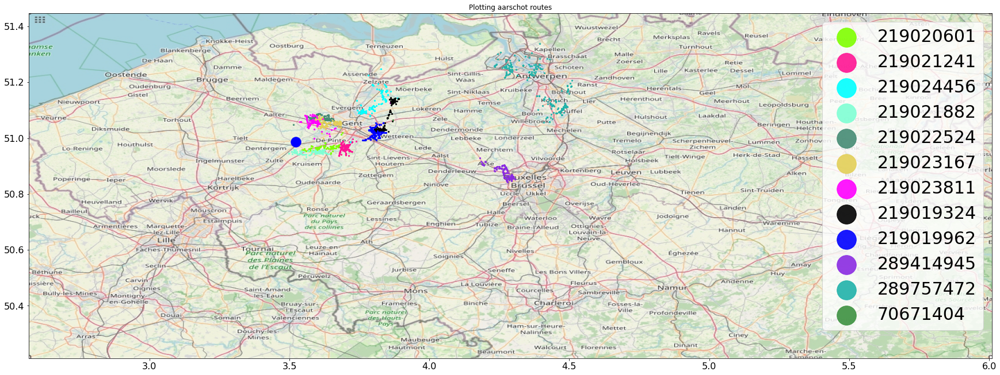

In [18]:
#Q5.7 Which routes should be reassigned to different depots?
df_Position["Customer_ID"] = df_Position.index

df_RouteTemplate["RouteTemplate_ID"] = df_RouteTemplate.index
df_Depot=df_Depot.rename(columns={"HVROUTETEMPLATE_NRID": "RouteTemplate_ID"})

#next we will merge the two databases df_RouteTemplate and df_CustomerType in order to link our customer and route info
df_CustomerType["CustomerID"]=df_CustomerType.index
df_Customer_Route = pd.merge(df_CustomerType, df_RouteTemplate, how = "left", on = "RouteTemplate_ID")
#for future question we will also need the depot so that's why we join them as well
df_Customer_Route_Depot = pd.merge(df_Depot, df_Customer_Route, how = "left", on = "RouteTemplate_ID")


df_customer_locations = pd.merge(df_Customer_Route_Depot,df_Position, how = "left", on = "Customer_ID").drop(
    columns = ["Postcode", "Language", "Season", "WEEKORDER", "DAYOFWEEK_NRID"])


df_deinze = df_customer_locations[df_customer_locations["DEPOT"].str.contains("Deinze")]
df_antwerpen = df_customer_locations[df_customer_locations["DEPOT"].str.contains("Antwerpen")]
df_aarschot = df_customer_locations[df_customer_locations["DEPOT"].str.contains("Aarschot")]
df_vilvoorde = df_customer_locations[df_customer_locations["DEPOT"].str.contains("Vilvoorde")]


###DEINZE###
kleuren_de = ["#7FFF00", "#FF1493", "#00FFFF", "#7FFFD4", "#458B74", "#E3CF57", "#FF00FF", "#000000", "#0000FF",
          "#8A2BE2", "#20B2AA", "#3D9140"]
#len(df_deinze["RouteTemplate_ID"].unique())
#There are 12 different routes in df_antwerpen so we make a list of 12 different colours

fig, ax = plt.subplots(figsize = (30,50))
directory = "ma.jpg"       #SET DIRECTORY VOOR WAAR UW LEGE MAP OPGESLAGEN IS
afb = plt.imread(directory)
                 
#Here we will plot every customer in a different color based on their routes. 
it = 0
for i in df_deinze["RouteTemplate_ID"].unique():
    coord = df_deinze[df_deinze["RouteTemplate_ID"] == i]
    ax.scatter(coord.LONG, coord.LAT, zorder=1, alpha= 0.9, color = kleuren_de[it], s=5, label = i)
    it += 1
    
ax.set_title('Plotting Deinze routes')

ax.scatter(3.5235857,50.9875406, zorder = 1, c = "b", s=300)  #coordinaten deinze depot
ax.set_xlim(2.5681,6.0095)
ax.set_ylim(50.2121,51.4472)
ax.legend(markerscale = 15.0, prop={'size': 30})
ax.imshow(afb, zorder=0, extent = (2.5681,6.0095,50.2121,51.4472), aspect= 'equal')

#Here we clearly see 289414945 as a route that should shift towards vilvoord for example.
#Or route 219022524 can be fitted at the depot Antwerp

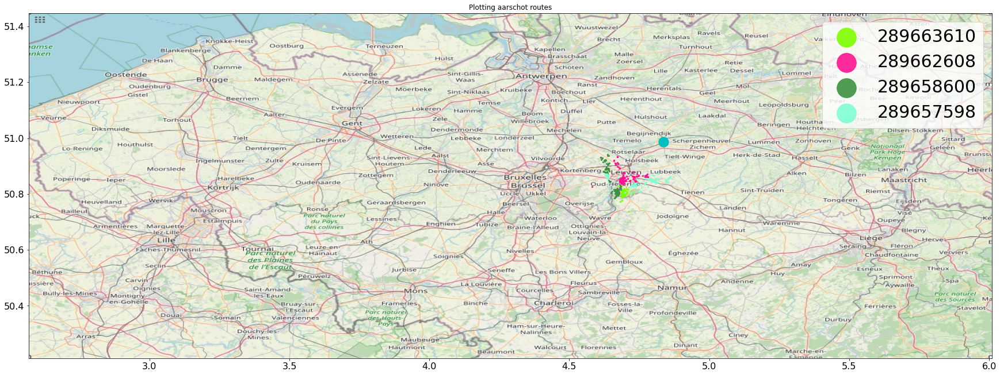

In [19]:
###AARSCHOT###
kleuren_aa = ["#7FFF00", "#FF1493", "#3D9140", "#7FFFD4"]
#len(df_aarschot["RouteTemplate_ID"].unique())
#There are 4 different routes in df_antwerpen so we make a list of 4 different colours

fig, ax = plt.subplots(figsize = (30,50))

#Here we will plot every customer in a different color based on their routes. 
it = 0
for i in df_aarschot["RouteTemplate_ID"].unique():
    coord = df_aarschot[df_aarschot["RouteTemplate_ID"] == i]
    ax.scatter(coord.LONG, coord.LAT, zorder=1, alpha= 0.9, color = kleuren_aa[it], s=5, label = i)
    it += 1
    
ax.set_title('Plotting aarschot routes')

ax.scatter(4.8365218, 50.9859959, zorder = 1, c = "c", s=300)  #coordinaten aarschot depot
ax.set_xlim(2.5681,6.0095)
ax.set_ylim(50.2121,51.4472)
ax.legend(markerscale = 15.0, prop={'size': 30})
ax.imshow(afb, zorder=0, extent = (2.5681,6.0095,50.2121,51.4472), aspect= 'equal')

#Here we see all routes present are very close to Aarschot, they are also close to vilvoorde, however
#as we see later by keeping them at Aarschot we have a more equal pressure on all the depots.

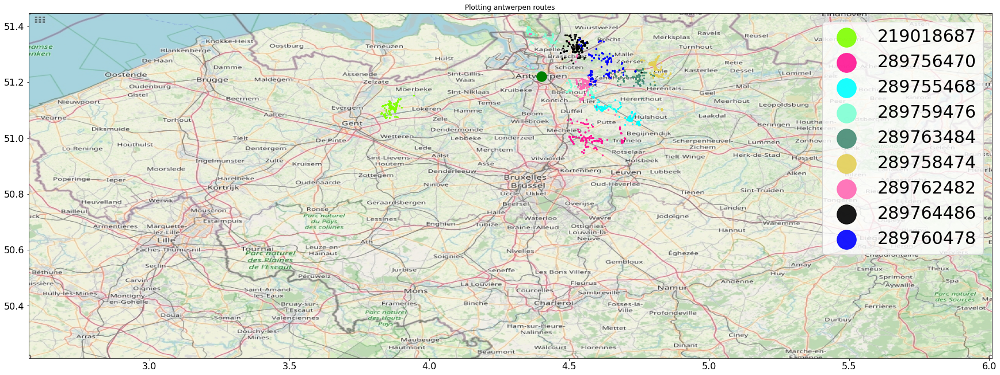

In [20]:
###ANTWERPEN###
kleuren_an = ["#7FFF00", "#FF1493", "#00FFFF", "#7FFFD4","#458B74", "#E3CF57", "#FF69B4", "#000000", "#0000FF"]
#len(df_antwerpen["RouteTemplate_ID"].unique())
#There are 9 different routes in df_antwerpen so we make a list of 9 different colours

fig, ax = plt.subplots(figsize = (30,50))

#Here we will plot every customer in a different color based on their routes. 
it = 0
for i in df_antwerpen["RouteTemplate_ID"].unique():
    coord = df_antwerpen[df_antwerpen["RouteTemplate_ID"] == i]
    ax.scatter(coord.LONG, coord.LAT, zorder=1, alpha= 0.9, color = kleuren_an[it], s=5, label = i)
    it += 1
    
ax.set_title('Plotting antwerpen routes')

ax.scatter(4.3997081,51.2211097, zorder = 1, c = "g", s=300)  #coordinaten antwerpen depot
ax.set_xlim(2.5681,6.0095)
ax.set_ylim(50.2121,51.4472)
ax.legend(markerscale = 15.0, prop={'size': 30})
ax.imshow(afb, zorder=0, extent = (2.5681,6.0095,50.2121,51.4472), aspect= 'equal')

#the plot shows us that the routes 219018687 should change to Deinze, and perhaps some of the customers from route 
#289762482 should switch to 289759476
#furthermore route 289756470 can switch to Vilvoorde and 
#route 289755468 can switch to Aarschot

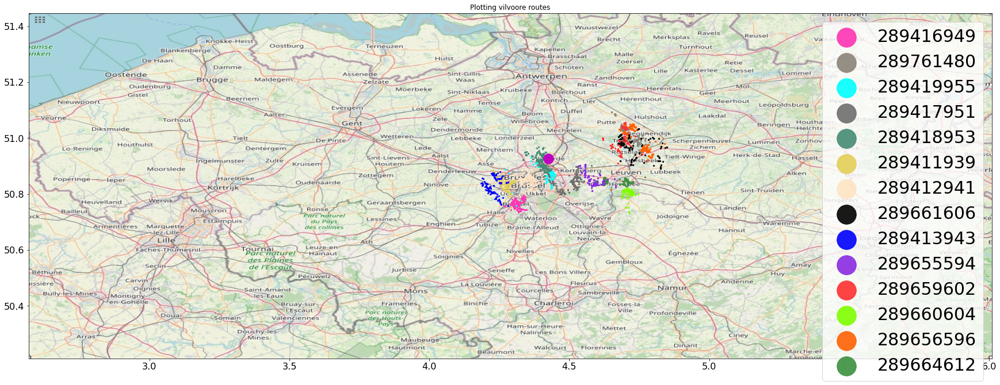

In [21]:
###VILVOORDE###


kleuren_v = ["#FF34B3", "#8B8378", "#00FFFF", "#6E6E6E","#458B74", "#E3CF57", "#FFE4C4", "#000000", "#0000FF",
          "#8A2BE2", "#FF3030", "#7FFF00", "#FF6103", "#3D9140"]
#len(df_vilvoorde["RouteTemplate_ID"].unique())
#There are 14 different routes in df_vilvoorde so we make a list of 14 different colours

fig, ax = plt.subplots(figsize = (30,50))

#Here we will plot every customer in a different color based on their routes. 
it = 0
for i in df_vilvoorde["RouteTemplate_ID"].unique():
    coord = df_vilvoorde[df_vilvoorde["RouteTemplate_ID"] == i]
    ax.scatter(coord.LONG, coord.LAT, zorder=1, alpha= 0.9, color = kleuren_v[it], s=5, label = i)
    it += 1
    
ax.set_title('Plotting vilvoore routes')

ax.scatter(4.4257868, 50.9272511, zorder = 1, c = "m", s=300)  #coordinaten vilvoorde depot
ax.set_xlim(2.5681,6.0095)
ax.set_ylim(50.2121,51.4472)
ax.legend(markerscale = 15.0, prop={'size': 30})
ax.imshow(afb, zorder=0, extent = (2.5681,6.0095,50.2121,51.4472), aspect= 'equal')

#We can clearly see that there are four different routes located on top of aarschot that can be relocated:
#289656596, 289659602, 289761480 and 289661606

In [75]:
#Q5.8 Which customers should be reassigned to different routes?
#We're going to determine how far each customer is from his or her depot in order to determine a cutoff value,
#This cutoff value can be determined be/derived from looking wether or not a route is closer (on average) to one depot.
#For this we calculate the distance between all the depots.

loc_deinze = 3.5235857,50.9875406
loc_aarschot = 4.8365218, 50.9859959
loc_antwerpen = 4.3997081,51.2211097
loc_vilvoorde = 4.4257868, 50.9272511

locaties_depot = list([loc_deinze, loc_aarschot, loc_antwerpen, loc_vilvoorde])

matrix_locaties = d = np.zeros((len(locaties_depot),len(locaties_depot)))
          
for d in range(0,len(locaties_depot)):
    for i in range(0, len(locaties_depot)):
       matrix_locaties[d,i] = (hs.haversine(locaties_depot[d], locaties_depot[i]))
        
pd.DataFrame(matrix_locaties, columns = ["Deinze", "Aarschot", "Antwerpen", "Vilvoorde"])

,Deinze,Aarschot,Antwerpen,Vilvoorde
0,0.000000,145.992135,100.807004,100.542989
1,145.992135,0.000000,55.120254,46.133454
2,100.807004,55.120254,0.000000,32.707570
3,100.542989,46.133454,32.707570,0.000000


In [76]:

l = []

for i in range(0,len(df_deinze)):
    loc1 = df_deinze.iloc[i,6],df_deinze.iloc[i,7]
    loc2 = (3.5235857,50.9875406)
    l.append(hs.haversine(loc1, loc2))
df_deinze["Distance2deinze"] = l

#by looking at the table above we can see that there is 100 km between deinze and vilvoord or deinze and antwerp. 
#Thus we take a cutoff value of 50 km, everything larger than 50km COULD give us an indication for switching


print(df_deinze[df_deinze["Distance2deinze"]>50]["RouteTemplate_ID"].unique())
#this shows us routes 289414945, 289757472 as the only routes that are further than the cutoff value so they can be reassigned.

df_deinze[df_deinze["Distance2deinze"]>50]["Customer_ID"] #gives us the names of everyone present in those two routes.



[289414945 289757472]


<ipython-input-76-be5f6cc9f30e>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_deinze["Distance2deinze"] = l


1279           1245116
1280           1247147
1281           1247154
1282           1247159
1283           1247170
             ...      
1645    25968589668348
1646    25975644376640
1647    25976044496640
1648    25985676253650
1649    26211756323438
Name: Customer_ID, Length: 368, dtype: int64

In [79]:
k = list()
for i in range(0,len(df_aarschot)):
    locA = df_aarschot.iloc[i,6],df_aarschot.iloc[i,7] #LONG en LAT zijn hier de 5e en 6e index kolom, indien niet ->aanpassen!
    locB = (4.3997081, 51.2211097)
    locB = (4.8365218, 50.9859959)
    k.append(hs.haversine(locA,locB))
df_aarschot["Distance2aarschot"] = k

#The distance from aarschot to vilvoorde (nearest depot) is 46.133454, so we take as cutoff value 23.066727 
df_aarschot[df_aarschot["Distance2aarschot"]>23]["RouteTemplate_ID"].unique()
#This gives us all the routes present in Aarschot, 289663610, 289662608, 289658600, 289657598

#However the majoraty of the routes are still present within the cluster. 


<ipython-input-79-3d568f21b110>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_aarschot["Distance2aarschot"] = k


,DEPOT,RouteTemplate_ID,CustomerType,Customer_ID,CustomerID,REGION,LONG,LAT,Distance2aarschot
5281,Aarschot,289663610,Private,701859,701859,C17,4.695557,50.820109,24.157669
5282,Aarschot,289663610,Horeca,1403452,1403452,C17,4.673649,50.828305,25.166219
5283,Aarschot,289663610,Private,1403634,1403634,C17,4.694961,50.809282,25.124079
5284,Aarschot,289663610,Private,1404652,1404652,C17,4.692451,50.791881,26.820154
5285,Aarschot,289663610,Private,1404657,1404657,C17,4.697508,50.795646,26.150344
...,...,...,...,...,...,...,...,...,...
5823,Aarschot,289657598,Private,22984388586446,22984388586446,C17,4.636664,50.856771,26.437366
5824,Aarschot,289657598,Private,23046160476440,23046160476440,C17,4.636926,50.854489,26.550830
5825,Aarschot,289657598,Private,23094676615642,23094676615642,C17,4.728757,50.827378,21.272330
5826,Aarschot,289657598,Private,23212860542648,23212860542648,C17,4.713435,50.825083,22.477917


In [83]:
k = list()
for i in range(0,len(df_antwerpen)):
    locA = df_antwerpen.iloc[i,6],df_antwerpen.iloc[i,7] #LONG en LAT zijn hier de 5e en 6e index kolom, indien niet ->aanpassen!
    locB = (4.3997081, 51.2211097)
    k.append(hs.haversine(locA,locB))
df_antwerpen["Distance2antwerpen"] = k


#distance antw-deinze = 100km
#distance antw aarschot = 51km
#distance antw vilvoorde = 32.7km

#Here we can use several cutoffs depending on which depot is (perhaps) closest

df_antwerpen[df_antwerpen["Distance2antwerpen"]>51]['RouteTemplate_ID'].unique() 
#Gives us route 219018687, 289758474. 219018687 is closer to deinze, however 289758474 is further so we only pick first route

df_antwerpen[(df_antwerpen["Distance2antwerpen"]< 50) & (df_antwerpen["Distance2antwerpen"] > 25.5)]['RouteTemplate_ID'].unique()
#Gives us routes 289756470, 289755468, 289759476, 289763484, 289758474, 289762482, 289764486, 289760478
#Only routes 289755468 and 289756470 have a majority of customers that are closer to vilvoorde or aarschot

df_antwerpen[(df_antwerpen["Distance2antwerpen"]< 25.5) & (df_antwerpen["Distance2antwerpen"] > 16.35)]['RouteTemplate_ID'].unique()
#Gives us routes 289756470, 289755468, 289759476, 289763484, 289762482, 289764486, 289760478
#But only 289756470 and 289755468 have a majority of customers that are closer to vilvoorde or aarschot

<ipython-input-83-66fd62b911ba>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_antwerpen["Distance2antwerpen"] = k


array([289756470, 289755468, 289759476, 289763484, 289762482, 289764486,
       289760478], dtype=int64)

In [86]:
k = list()
for i in range(0,len(df_vilvoorde)):
    locA = df_vilvoorde.iloc[i,6],df_vilvoorde.iloc[i,7] #LONG en LAT zijn hier de 5e en 6e index kolom, indien niet ->aanpassen!
    locB = (4.3997081, 51.2211097)
    k.append(hs.haversine(locA,locB))
df_vilvoorde["Distance2vilvoorde"] = k

#distance vilvoorde - aarschot = 46.13 km so cutoff is 23km
df_vilvoorde[df_vilvoorde["Distance2vilvoorde"] > 23]["RouteTemplate_ID"].unique()
#gives us 289416949, 289761480, 289419955, 289417951, 289418953, 289411939, 289412941, 
#289661606, 289413943, 289655594, 289659602, 289660604, 289656596, 289664612 as possible routes, however only
#289656596, 289659602, 289761480 and 289661606 are closer to aarschot, with routes 289664612 slight potential 28966060.


<ipython-input-86-9a1a62404af1>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vilvoorde["Distance2vilvoorde"] = k


array([289416949, 289761480, 289419955, 289417951, 289418953, 289411939,
       289412941, 289661606, 289413943, 289655594, 289659602, 289660604,
       289656596, 289664612], dtype=int64)

In [26]:
#Q5.9 Which depots should be removed? Where should the company create new depots?
#If we look at our plotted map of Belgium:
#Based on the number of customers and the distance, the depot in Aarschot should be removed. 
#It is not located very close to the centre of any cluster of customers.

#By opening a new depot that in the region Geraardsbergen - Ninove - Enghien you would be able to serve all clusters even more
#without traveling a very large distance. 


#Potentially we can ope a depot more south near Charleroi to decreaese the large pressure on the Depot in vilvoorde
RouteTemplate_with_DepotLocation = pd.merge(df_RouteTemplate, df_Depot, how = "inner", on = "RouteTemplate_ID")
Customer_with_DepotLocation = pd.merge(df_CustomerType, RouteTemplate_with_DepotLocation, how = "inner", on = "RouteTemplate_ID")
Visit_with_DepotLocation = pd.merge(Customer_with_DepotLocation, df_CompanyVisit, how = "inner", on = "Customer_ID")

Quantity_with_DepotLocation = pd.merge(Visit_with_DepotLocation, df_VisitDetails, how = "inner", on = "Visit_ID")
Products_with_DepotLocation_1 = pd.merge(Quantity_with_DepotLocation, df_Products, how = "inner", on = "Product_ID")
#We will also look at the number of products and the number of clients per Depot
nr_of_cust_per_Depot = Products_with_DepotLocation_1.groupby("DEPOT")["Customer_ID"].nunique()
nr_of_products_per_Depot = Products_with_DepotLocation_1.groupby("DEPOT")["Product_ID"].nunique()
nr_of_products_per_Depot

DEPOT
Aarschot     261
Antwerpen    293
Deinze       290
Vilvoorde    284
Name: Product_ID, dtype: int64

In [27]:
#Q5.10 Which products should be added / removed from depots?
# Q5.10 Which products should be added/ removed form depots:
# FIRST RUN Q1.3 IN ORDER TO RUN THIS CODE
# Q1.3 SHOULD BE RUN TWICE AS MENTIONED IN THE ANSWER TO THIS QUESTION

# First, we are going to look if certain products should be removed from Depots
# Therefore, we are to look if there are products that have no or few sales in a certain Depot
# Therefore, we need the dataframes per depot, defined in question 1.3
# Now we will analyse each depot separately.

df_Deinze = Products_with_DepotLocation_1[Products_with_DepotLocation_1["DEPOT"] == "Deinze"]
df_Aarschot = Products_with_DepotLocation_1[Products_with_DepotLocation_1["DEPOT"] == "Aarschot"]
df_Antwerpen = Products_with_DepotLocation_1[Products_with_DepotLocation_1["DEPOT"] == "Antwerpen"]
df_Vilvoorde = Products_with_DepotLocation_1[Products_with_DepotLocation_1["DEPOT"] == "Vilvoorde"]

# 1) The depot in Deinze
# before continuing, we will first clean this dataframe and drop irrelevant columns
df_Deinze_clean = df_Deinze.drop(columns = ["RouteTemplate_ID", "CustomerType", "Postcode", "Language", "Season", "REGION", "WEEKORDER", 
                                        "DAYOFWEEK_NRID", "Time", "Date", "paymentMethod" ])

# Now, we add all the products of the company to this dataset through a left merge 
# This way, also products that weren't sold are now in the dataset
All_Products_Deinze = pd.merge(df_Products, df_Deinze_clean, how = "left", on = "Product_ID")

# Now, we calculate how many times a product has been sold in the depot
df_Deinze_product_quantities = All_Products_Deinze.groupby("Product_ID")["Quantity"].sum()

# Now, we merge this information with the information about the products, through a left merge.
# This way, also the products that were not sold in the depot are included in the dataframe
# Next, we sort this dataset based on quantity to see which products were not sold in this depot and thus
# can be removed. We also delete the coupons from this dataset as these are not really products and
# finally, we create a subdataset with all the products to remove from the depot
df_quantity_per_product_Deinze = pd.merge(df_Deinze_product_quantities, df_Products, how = "right", on = "Product_ID")
df_quantity_per_product_Deinze_clean = df_quantity_per_product_Deinze[df_quantity_per_product_Deinze["Family"] != "Coupon"]

df_remove_products_Deinze = df_quantity_per_product_Deinze_clean[df_quantity_per_product_Deinze_clean["Quantity"] == 0.0]
df_remove_products_Deinze

# 2) The same procedure for the depot in Aarschot
# before continuing, we will first clean this dataframe and drop irrelevant columns
df_Aarschot_clean = df_Aarschot.drop(columns = ["RouteTemplate_ID","CustomerType", "Postcode", "Language", "Season", "REGION", "WEEKORDER", 
                                        "DAYOFWEEK_NRID", "Time", "Date", "paymentMethod" ])

# Now, we add all the products of the company to this dataset through a left merge 
# This way, also products that weren't sold are now in the dataset
All_Products_Aarschot = pd.merge(df_Products, df_Aarschot_clean, how = "left", on = "Product_ID")

# Now, we calculate how many times a product has been sold in the depot
df_Aarschot_product_quantities = All_Products_Aarschot.groupby("Product_ID")["Quantity"].sum()
df_Aarschot_product_quantities

# Then, we apply the same procedure as described for Deinze, resulting in 
# a subdataset with all the products to remove from the depot
df_quantity_per_product_Aarschot = pd.merge(df_Aarschot_product_quantities, df_Products, how = "right", on = "Product_ID")
df_quantity_per_product_Aarschot.sort_values(by = "Quantity").head(50)
df_quantity_per_product_Deinze_clean = df_quantity_per_product_Aarschot[df_quantity_per_product_Aarschot["Family"] != "Coupon"]

df_remove_products_Aarschot = df_quantity_per_product_Deinze_clean[df_quantity_per_product_Deinze_clean["Quantity"] == 0.0]
df_remove_products_Aarschot

# 3) The same procedure for the depot in Antwerpen
# before continuing, we will first clean this dataframe and drop irrelevant columns
df_Antwerpen_clean = df_Antwerpen.drop(columns = ["RouteTemplate_ID","CustomerType", "Postcode", "Language", "Season", "REGION", "WEEKORDER", 
                                        "DAYOFWEEK_NRID", "Time", "Date", "paymentMethod" ])

# Now, we add all the products of the company to this dataset through a left merge 
# This way, also products that weren't sold are now in the dataset
All_Products_Antwerpen = pd.merge(df_Products, df_Antwerpen_clean, how = "left", on = "Product_ID")

# Now, we calculate how many times a product has been sold in the depot
df_Antwerpen_product_quantities = All_Products_Antwerpen.groupby("Product_ID")["Quantity"].sum()


# Then, we apply the same procedure as described for Deinze, resulting in 
# a subdataset with all the products to remove from the depot
df_quantity_per_product_Antwerpen = pd.merge(df_Antwerpen_product_quantities, df_Products, how = "right", on = "Product_ID")
df_quantity_per_product_Antwerpen_clean = df_quantity_per_product_Antwerpen[df_quantity_per_product_Antwerpen["Family"] != "Coupon"]

df_remove_products_Antwerpen = df_quantity_per_product_Antwerpen_clean[df_quantity_per_product_Antwerpen_clean["Quantity"] == 0.0]
df_remove_products_Antwerpen

# 4) The same procedure for the depot in Vilvoorde
# before continuing, we will first clean this dataframe and drop irrelevant columns
df_Vilvoorde_clean = df_Vilvoorde.drop(columns = ["RouteTemplate_ID","CustomerType", "Postcode", "Language", "Season", "REGION", "WEEKORDER", 
                                        "DAYOFWEEK_NRID", "Time", "Date", "paymentMethod" ])

# Now, we add all the products of the company to this dataset through a left merge 
# This way, also products that weren't sold are now in the dataset
All_Products_Vilvoorde = pd.merge(df_Products, df_Vilvoorde_clean, how = "left", on = "Product_ID")

# Now, we calculate how many times a product has been sold in the depot
df_Vilvoorde_product_quantities = All_Products_Vilvoorde.groupby("Product_ID")["Quantity"].sum()

# Then, we apply the same procedure as described for Deinze, resulting in 
# a subdataset with all the products to remove from the depot
df_quantity_per_product_Vilvoorde = pd.merge(df_Vilvoorde_product_quantities, df_Products, how = "right", on = "Product_ID")
df_quantity_per_product_Vilvoorde_clean = df_quantity_per_product_Vilvoorde[df_quantity_per_product_Vilvoorde["Family"] != "Coupon"]

df_remove_products_Vilvoorde = df_quantity_per_product_Vilvoorde_clean[df_quantity_per_product_Vilvoorde_clean["Quantity"] == 0.0]
df_remove_products_Vilvoorde

,Product_ID,Quantity,Description,Category,Family,Price
14,23772,0.0,Il Classico Vanille-Aardbei,Verkoopsartikel,Ice Cakes,7.4
33,38296640,0.0,Sint Jacobsschelp 2x150g,Verkoopsartikel,Meals,9.9
76,23705,0.0,"2,5 L.Praline (Caddy)",Verkoopsartikel,Scoop Ice,8.3
78,23712,0.0,"2,5 L.Stracciatella (Caddy)",Verkoopsartikel,Scoop Ice,8.3
93,23844,0.0,Orig. Chocolate & Biscuits/6,Verkoopsartikel,Cups,7.5
111,18424244393052,0.0,"2,5 L.Citroen (Caddy)",Verkoopsartikel,Scoop Ice,8.3
168,23796,0.0,"2,5 L.Sorbet Passievruchten (C",Verkoopsartikel,Scoop Ice,9.4
169,23797,0.0,"2,5 L.Sorbet Framboos (Caddy)",Verkoopsartikel,Scoop Ice,9.4
201,46145573,0.0,Penne met zalm 2x400gr,Verkoopsartikel,Meals,7.0
207,18832444153838,0.0,Horeca Quickschepper (1/30),POS,POS inside,14.9


count    5112.000000
mean       62.695618
std        20.341462
min         0.000000
25%        50.000000
50%        75.000000
75%        75.000000
max       100.000000
Name: reviewScorePercentage, dtype: float64


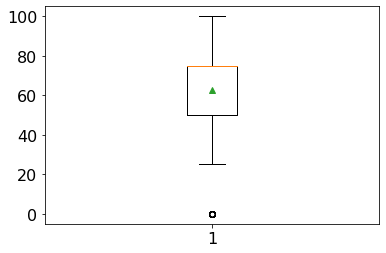

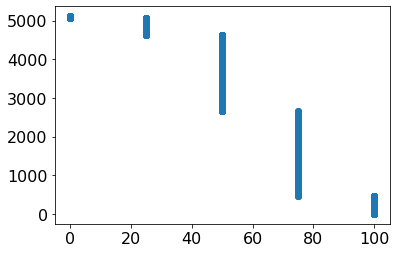

In [28]:
#Q5.11 Does customer satisfaction relate to different factors? Can the company respond to these
#factors?

#Firstly we take the Reviews dataframe containing the review score and the customer_ID
#And turn the str review into a score 
def reviewScore(review: str):
    if(review == "Excellent service, very satisfied"):
        return 4
    elif(review == "Good service, satisfied"):
        return 3
    elif(review == "No opinion"):
        return 2
    elif(review == "Not completely satisfied"):
        return 1
    else:
        return 0
def getScorePercentage(review: int):
    return (review/4)*100
#Using this function we can determine how satisfied customers are overall:
#We use a reviewScore from 0 to 4 and express it in a percentage for clarity
#by divinding these scores by 4 and multiplying them with 100

#We apply both these functions and store the results in new columns
#In the reviews data frame
df_Reviews["reviewScore"]=df_Reviews["Review"].apply(reviewScore)
df_Reviews["reviewScorePercentage"]=df_Reviews["reviewScore"].apply(getScorePercentage)
df_Reviews=df_Reviews.sort_values(by="reviewScore", ascending=False)

#We can see that in total we have 5112 reviews and use describe to get other statistics
print(df_Reviews["reviewScorePercentage"].describe())

#The company gets a 6.3/10 on average
#These are not the best review scores but are postive/good 
plt.boxplot(df_Reviews["reviewScorePercentage"],showmeans=True)
plt.show()

#The boxplot show a healthy behaviour. Nicely centered around this mean of 62.7 percent
#and having a std of roughly 20.34 at both sides
plt.scatter(df_Reviews["reviewScorePercentage"],range(0,len(df_Reviews)))
plt.show()

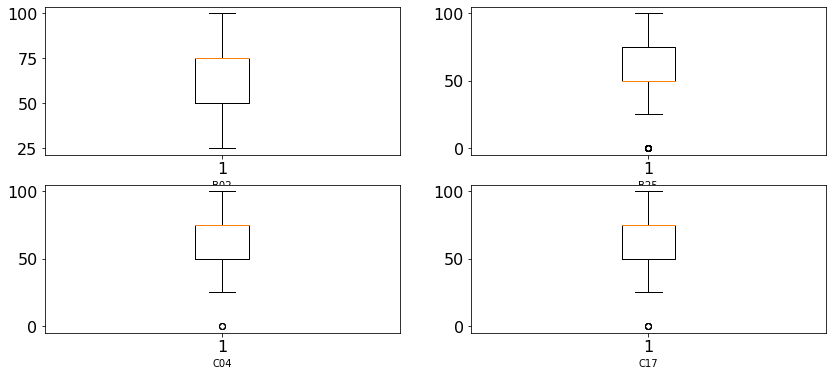

In [29]:
#Now we will look at the different reviews scores around different regions
df_Reviews["Customer_ID"]=df_Reviews.index

#First we merge dataframes in order to get information of the customers linked to the review
df_CleanedCustomerType = df_CustomerType.drop(columns=["CustomerID","Season"])
df_ReviewCust = pd.merge(df_Reviews,df_CleanedCustomerType, on="Customer_ID",how="left")
#Next we merge with the routes they are assinged to, to get the region and other descriptors
df_ReviewCustLoc = pd.merge(df_ReviewCust,df_RouteTemplate, on="RouteTemplate_ID",how="left").dropna()

#We have the following Regions: BO2, C17, C04, B25
#print(df_ReviewCustLoc["REGION"].unique())
df_ReviewB02 = df_ReviewCustLoc[df_ReviewCustLoc["REGION"]=="B02"]
df_ReviewC17 = df_ReviewCustLoc[df_ReviewCustLoc["REGION"]=="C17"]
df_ReviewC04 = df_ReviewCustLoc[df_ReviewCustLoc["REGION"]=="C04"]
df_ReviewB25 = df_ReviewCustLoc[df_ReviewCustLoc["REGION"]=="B25"]

#print("B02:",df_ReviewB02["reviewScorePercentage"].describe())
#print("C17:",df_ReviewC17["reviewScorePercentage"].describe())
#print("C04:",df_ReviewC04["reviewScorePercentage"].describe()) 
#print("B25:",df_ReviewB25["reviewScorePercentage"].describe()) 

#Comparing these regions
plt.figure(figsize=(14,6))
plt.subplot(2,2,1)
plt.boxplot(df_ReviewB02["reviewScorePercentage"])
plt.xlabel("B02")
plt.subplot(2,2,2)
plt.boxplot(df_ReviewB25["reviewScorePercentage"])
plt.xlabel("B25")
plt.subplot(2,2,3)
plt.boxplot(df_ReviewC04["reviewScorePercentage"])
plt.xlabel("C04")
plt.subplot(2,2,4)
plt.boxplot(df_ReviewC17["reviewScorePercentage"],)
plt.xlabel("C17")

plt.show()


#We can see on the given plots differences between regions and add the statistics descriptions 
#All regions have about the same statistics besides B25: a mean of around 66/69 out of 100
#with about the same std dev of 18
#The biggest insight however is that region B25 responds poorly 
#Having a mean of 52.3 percent which is very close to no opinion: while the others are closer to good/satisfied
#On top of that results are varying more with a std of 22.519

#It is clear to see something went wrong in Region B25 as the amount of reviews
#Are about the same for every single region

Text(0.5, 0, 'French')

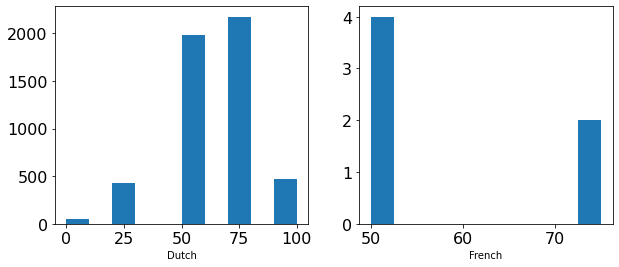

In [30]:
#We Look at the factor Language
df_ReviewCustLocNL = df_ReviewCustLoc[df_ReviewCustLoc["Language"]=="nl-BE"].drop(columns=["Postcode","CustomerType","RouteTemplate_ID","Customer_ID","DAYOFWEEK_NRID","WEEKORDER","REGION"])
df_ReviewCustLocFR = df_ReviewCustLoc[df_ReviewCustLoc["Language"]=="fr-BE"].drop(columns=["Postcode","CustomerType","RouteTemplate_ID","Customer_ID","DAYOFWEEK_NRID","WEEKORDER","REGION"])

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.hist(df_ReviewCustLocNL["reviewScorePercentage"])
plt.xlabel("Dutch")

plt.subplot(1,2,2)
plt.hist(df_ReviewCustLocFR["reviewScorePercentage"])
plt.xlabel("French")

#There are only 5 reviews for french speakers so we omit this as a possible factor

Text(0.5, 0, 'Catering')

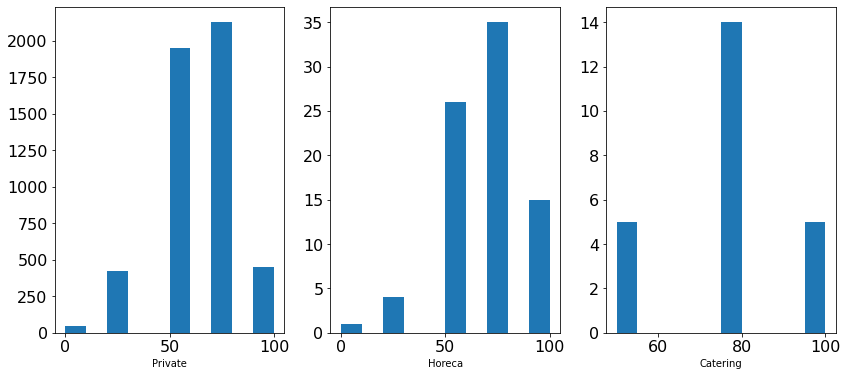

In [31]:
#Look at CustomerType
df_ReviewCustLocPrivate = df_ReviewCustLoc[df_ReviewCustLoc["CustomerType"]=="Private"].drop(columns=["Postcode","Language","RouteTemplate_ID","Customer_ID","DAYOFWEEK_NRID","WEEKORDER","REGION"])
df_ReviewCustLocHoreca = df_ReviewCustLoc[df_ReviewCustLoc["CustomerType"]=="Horeca"].drop(columns=["Postcode","Language","RouteTemplate_ID","Customer_ID","DAYOFWEEK_NRID","WEEKORDER","REGION"])
df_ReviewCustLocCatering = df_ReviewCustLoc[df_ReviewCustLoc["CustomerType"]=="Catering"].drop(columns=["Postcode","Language","RouteTemplate_ID","Customer_ID","DAYOFWEEK_NRID","WEEKORDER","REGION"])

plt.figure(figsize=(14,6))
plt.subplot(1,3,1)
plt.hist(df_ReviewCustLocPrivate["reviewScorePercentage"])
plt.xlabel("Private")

plt.subplot(1,3,2)
plt.hist(df_ReviewCustLocHoreca["reviewScorePercentage"])
plt.xlabel("Horeca")

plt.subplot(1,3,3)
plt.hist(df_ReviewCustLocCatering["reviewScorePercentage"])
plt.xlabel("Catering")

#The plot of catering only has a set of 24 reviews and 
#Horeca 74, while there are 4719 private reviews: No conclusions can be drawn
#Test groups are too small
